# Khai thác và Phân tích Dataset Toàn diện (EDA)
Notebook này phân tích toàn bộ dữ liệu từ `train` và `valid` (dựa trên `data.yaml`), giúp bạn cái nhìn sâu sắc nhất về:
1. Số lượng ảnh, tỷ lệ mất nhãn.
2. Phân bố nhãn (để đưa ra quyết định gộp nhãn sau này).
3. Kích thước và vị trí của các bounding box (giúp thiết lập thông số camera).
4. Trực quan hóa dữ liệu thực tế.

In [21]:
import os
import glob
import cv2
import yaml
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

# Thiết lập style đồ thị
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# Đọc cấu hình từ data.yaml
with open('data.yaml', 'r') as f:
    data_config = yaml.safe_load(f)

CLASS_NAMES = data_config.get('names', [])
print(f"Tìm thấy {len(CLASS_NAMES)} classes: {CLASS_NAMES}")

Tìm thấy 8 classes: ['0', '1', '2', '3', '4', '5', '6', 'caucasian']


## 1. Tải và Tổng hợp Dữ liệu (Data Loading)

In [22]:
def load_dataset_info(split_name, images_dir, labels_dir):
    data = []
    img_files = glob.glob(os.path.join(images_dir, '*.*'))
    img_files = [f for f in img_files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    for img_path in img_files:
        filename = os.path.basename(img_path)
        base_name = os.path.splitext(filename)[0]
        label_path = os.path.join(labels_dir, base_name + '.txt')
        
        has_label = False
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        xc, yc, w, h = map(float, parts[1:5])
                        data.append({
                            'split': split_name,
                            'image_path': img_path,
                            'image_name': filename,
                            'class_id': class_id,
                            'class_name': CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else str(class_id),
                            'x_center': xc, 'y_center': yc, 'width': w, 'height': h,
                            'has_label': True
                        })
                        has_label = True
        
        # Nếu ảnh không có nhãn (Background image)
        if not has_label:
            data.append({
                'split': split_name,
                'image_path': img_path,
                'image_name': filename,
                'class_id': -1,
                'class_name': 'Background (No Label)',
                'x_center': float('nan'), 'y_center': float('nan'), 'width': float('nan'), 'height': float('nan'),
                'has_label': False
            })
            
    return pd.DataFrame(data)

# Đọc thư mục train và valid theo format của Roboflow / data.yaml
df_train = load_dataset_info('train', 'train/images', 'train/labels')
df_valid = load_dataset_info('valid', 'valid/images', 'valid/labels')
df_all = pd.concat([df_train, df_valid], ignore_index=True)

print(f"Tổng số lượng Bounding Boxes (bao gồm ảnh nền): {len(df_all)}")
display(df_all.head())

Tổng số lượng Bounding Boxes (bao gồm ảnh nền): 4873


,split,image_path,image_name,class_id,class_name,x_center,y_center,width,height,has_label
0,train,train/images\frame_00000_jpg.rf.33859b0826350a...,frame_00000_jpg.rf.33859b0826350a09f7bf4cf7f89...,0,0,0.464844,0.296875,0.067187,0.047656,True
1,train,train/images\frame_00000_jpg.rf.33859b0826350a...,frame_00000_jpg.rf.33859b0826350a09f7bf4cf7f89...,1,1,0.575781,0.299219,0.060937,0.039844,True
2,train,train/images\frame_00000_jpg.rf.33859b0826350a...,frame_00000_jpg.rf.33859b0826350a09f7bf4cf7f89...,2,2,0.517188,0.452344,0.094531,0.070312,True
3,train,train/images\frame_00000_jpg.rf.33859b0826350a...,frame_00000_jpg.rf.33859b0826350a09f7bf4cf7f89...,5,5,0.527344,0.323437,0.235156,0.441406,True
4,train,train/images\frame_00001_jpg.rf.5d82587b46b42c...,frame_00001_jpg.rf.5d82587b46b42c8d81e154e8e60...,0,0,0.391406,0.475000,0.079687,0.046094,True


## 2. Thống kê Tổng quan (Overview)

=== TỔNG QUAN DATASET ===
Tổng số ảnh: 1221
- Ảnh Train: 977 (80.0%)
- Ảnh Valid: 244 (20.0%)
- Ảnh Background (Không có nhãn): 1 (0.1%)


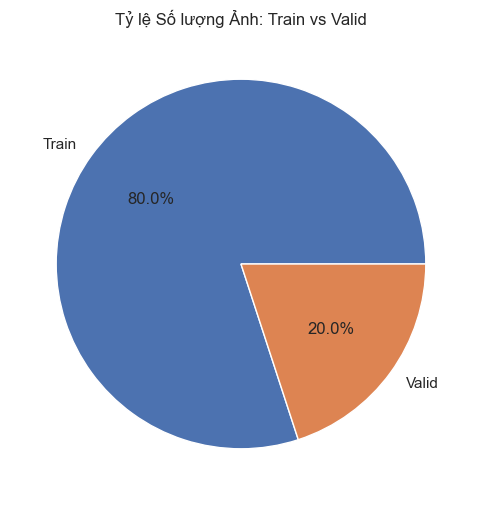

In [23]:
total_images = df_all['image_path'].nunique()
train_images = df_train['image_path'].nunique()
valid_images = df_valid['image_path'].nunique()
bg_images = df_all[df_all['has_label'] == False]['image_path'].nunique()

print("=== TỔNG QUAN DATASET ===")
print(f"Tổng số ảnh: {total_images}")
print(f"- Ảnh Train: {train_images} ({train_images/total_images*100:.1f}%)")
print(f"- Ảnh Valid: {valid_images} ({valid_images/total_images*100:.1f}%)")
print(f"- Ảnh Background (Không có nhãn): {bg_images} ({bg_images/total_images*100:.1f}%)")

# Biểu đồ tròn chia tỷ lệ tập Train/Valid
plt.figure(figsize=(6, 6))
plt.pie([train_images, valid_images], labels=['Train', 'Valid'], autopct='%1.1f%%', colors=['#4C72B0', '#DD8452'])
plt.title('Tỷ lệ Số lượng Ảnh: Train vs Valid')
plt.show()

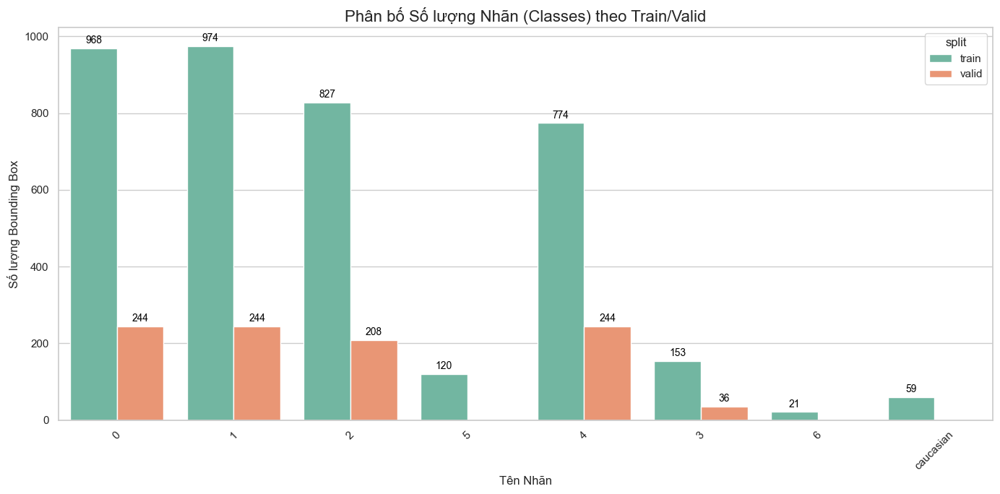

In [24]:
df_labeled = df_all[df_all['has_label'] == True]

plt.figure(figsize=(14, 7))
ax = sns.countplot(data=df_labeled, x='class_name', hue='split', palette='Set2')
plt.title('Phân bố Số lượng Nhãn (Classes) theo Train/Valid', fontsize=16)
plt.xlabel('Tên Nhãn', fontsize=12)
plt.ylabel('Số lượng Bounding Box', fontsize=12)
plt.xticks(rotation=45)

# Hiển thị số liệu trên cột
for p in ax.patches:
    if p.get_height() > 0:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')

plt.tight_layout()
plt.show()

## 4. Số lượng Đối tượng (Khuôn mặt) trên mỗi ảnh
Kiểm tra xem dataset của bạn thường có 1 khuôn mặt hay nhiều khuôn mặt trong 1 frame hình.

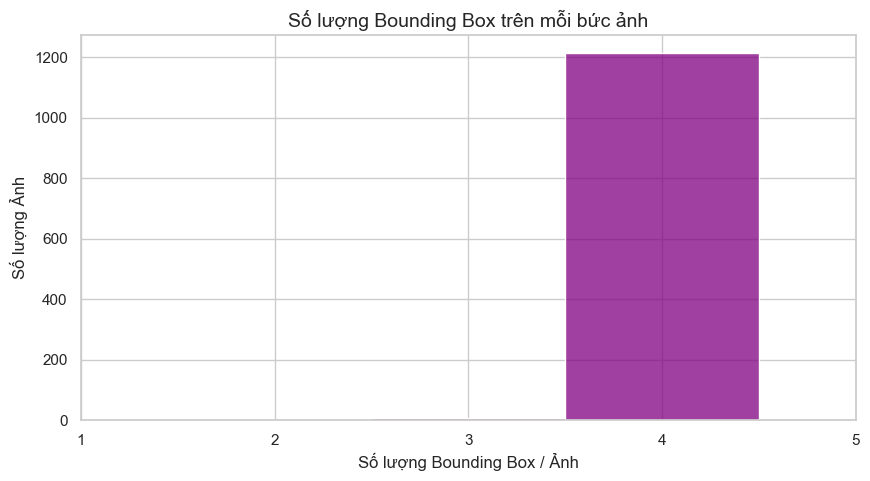

In [25]:
bboxes_per_image = df_labeled.groupby('image_path').size()

plt.figure(figsize=(10, 5))
sns.histplot(bboxes_per_image, bins=range(1, int(bboxes_per_image.max()) + 3), discrete=True, color='purple')
plt.title('Số lượng Bounding Box trên mỗi bức ảnh', fontsize=14)
plt.xlabel('Số lượng Bounding Box / Ảnh')
plt.ylabel('Số lượng Ảnh')
plt.xticks(range(1, int(bboxes_per_image.max()) + 2))
plt.show()

## 5. Phân tích Kích thước và Tỷ lệ Bounding Box
- Nếu khuôn mặt quá nhỏ (width, height < 0.05), mô hình Edge (như YOLO11n trên Raspberry Pi) có thể không phát hiện được.
- Aspect Ratio (w/h) giúp xem khuôn mặt có bị biến dạng không.

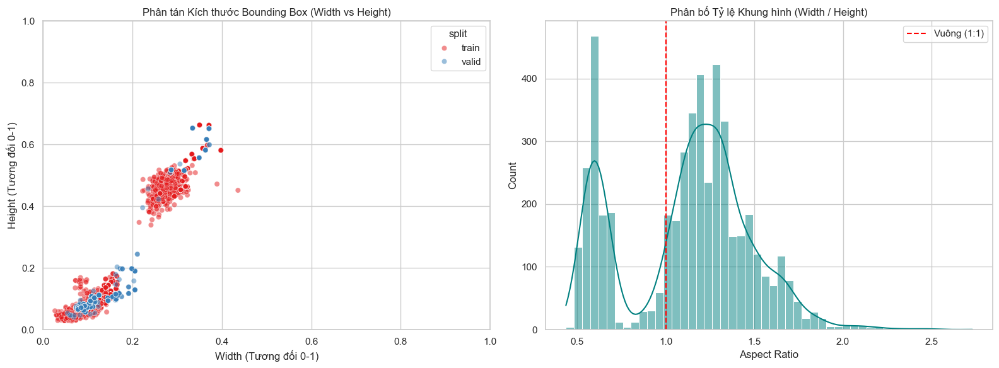

In [26]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Biểu đồ phân tán Kích thước (Thêm hue=split để xem train/valid có tương đồng không)
sns.scatterplot(data=df_labeled, x='width', y='height', hue='split', alpha=0.5, ax=ax1, palette='Set1')
ax1.set_title('Phân tán Kích thước Bounding Box (Width vs Height)')
ax1.set_xlabel('Width (Tương đối 0-1)')
ax1.set_ylabel('Height (Tương đối 0-1)')
ax1.set_xlim(0, 1)
ax1.set_ylim(0, 1)

# Biểu đồ tỷ lệ Aspect Ratio
df_labeled_copy = df_labeled.copy()
df_labeled_copy['aspect_ratio'] = df_labeled_copy['width'] / df_labeled_copy['height']
sns.histplot(data=df_labeled_copy, x='aspect_ratio', bins=50, color='teal', kde=True, ax=ax2)
ax2.set_title('Phân bố Tỷ lệ Khung hình (Width / Height)')
ax2.set_xlabel('Aspect Ratio')
ax2.axvline(1.0, color='red', linestyle='--', label='Vuông (1:1)')
ax2.legend()

plt.tight_layout()
plt.show()

## 6. Vị trí Khuôn mặt (Center Heatmap)
Bản đồ nhiệt cho thấy khuôn mặt tài xế thường xuất hiện ở tọa độ nào trên camera. Rất hữu ích để crop ảnh khi đưa lên thiết bị Edge.

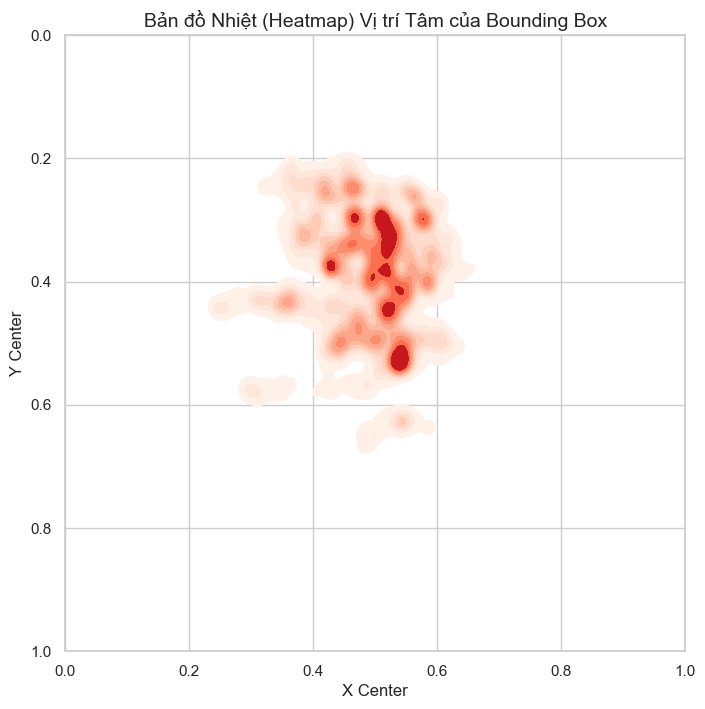

In [27]:
plt.figure(figsize=(8, 8))
sns.kdeplot(data=df_labeled, x='x_center', y='y_center', cmap="Reds", fill=True, bw_adjust=0.5)
plt.title('Bản đồ Nhiệt (Heatmap) Vị trí Tâm của Bounding Box', fontsize=14)
plt.xlabel('X Center')
plt.ylabel('Y Center')
plt.xlim(0, 1)
plt.ylim(1, 0)  # Đảo chiều Y để trục (0,0) nằm ở góc trên cùng bên trái giống ảnh thực tế
plt.show()

## 7. Trực quan hóa Dữ liệu (Visual Check)
Kiểm tra thực tế ngẫu nhiên các khung hình trong dataset. 

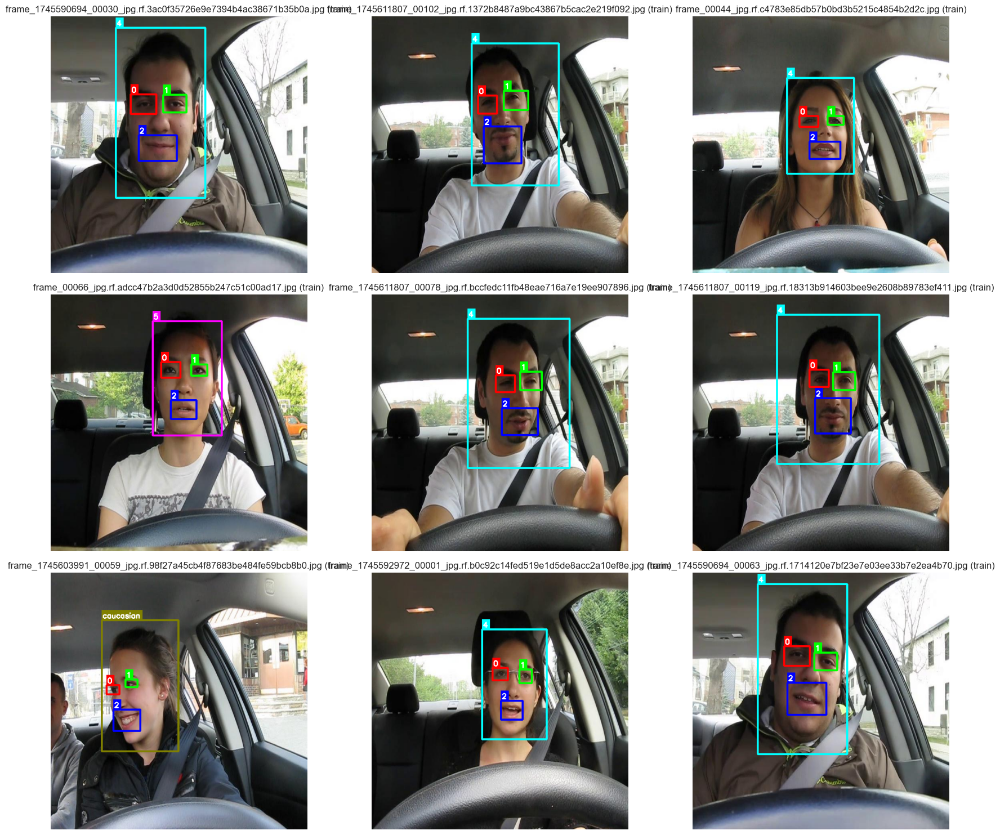

In [28]:
def show_random_samples(df, num_samples=9):
    unique_images = df[df['has_label'] == True]['image_path'].unique()
    if len(unique_images) == 0:
        print("Không có ảnh nào để hiển thị.")
        return
        
    selected_imgs = random.sample(list(unique_images), min(num_samples, len(unique_images)))
    
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255), (255, 0, 255), (128, 0, 128), (128, 128, 0)]
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 15))
    axes = axes.flatten()
    
    for i, img_path in enumerate(selected_imgs):
        if i >= 9: break
        img = cv2.imread(img_path)
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        
        img_boxes = df[df['image_path'] == img_path]
        for _, row in img_boxes.iterrows():
            class_id = row['class_id']
            class_name = row['class_name']
            color = colors[class_id % len(colors)]
            
            xc, yc, bw, bh = row['x_center'], row['y_center'], row['width'], row['height']
            x1, y1 = int((xc - bw/2) * w), int((yc - bh/2) * h)
            x2, y2 = int((xc + bw/2) * w), int((yc + bh/2) * h)
            
            cv2.rectangle(img, (x1, y1), (x2, y2), color, max(1, int(w*0.005)))
            text_size = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)[0]
            cv2.rectangle(img, (x1, max(y1-25, 0)), (x1 + text_size[0] + 5, y1), color, -1)
            cv2.putText(img, class_name, (x1+2, max(y1-5, 15)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
            
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"{os.path.basename(img_path)} ({row['split']})")
        
    plt.tight_layout()
    plt.show()

show_random_samples(df_labeled, 9)

## 8. Khám phá Nhãn Ẩn Danh (Class 0 đến 7)
Vì bộ dữ liệu gốc đặt tên nhãn là số (0, 1, 2...), ô code này sẽ in ra **4 ví dụ ngẫu nhiên cho MỖI nhãn**. Nhìn vào hình ảnh bạn sẽ xác định được ý nghĩa thực sự của chúng (VD: Nhắm mắt, Ngáp, Gọi điện...)

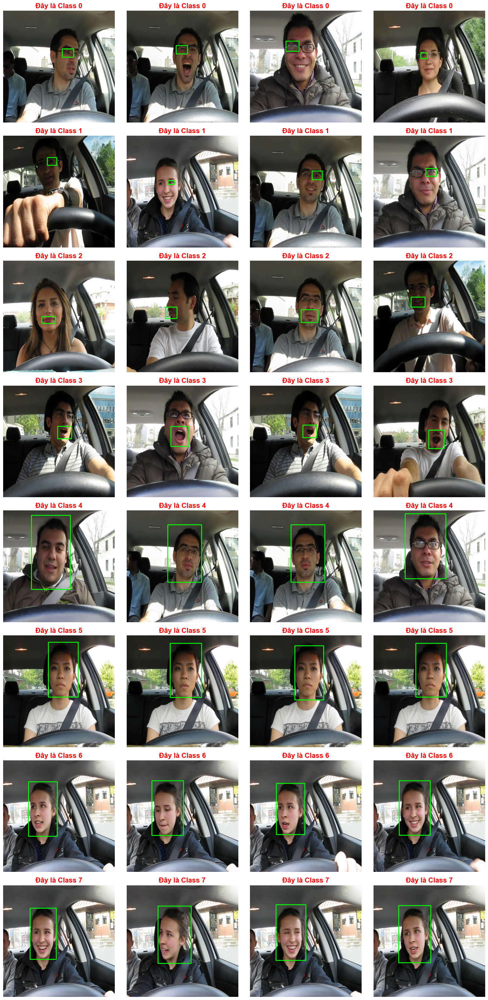

In [29]:
def show_samples_per_class(df, images_per_class=4):
    # Lấy danh sách các class_id (trừ Background = -1)
    unique_classes = sorted(df[df['class_id'] != -1]['class_id'].unique())
    
    if len(unique_classes) == 0:
        print("Không có nhãn nào trong dataset.")
        return
        
    fig, axes = plt.subplots(len(unique_classes), images_per_class, figsize=(16, 4 * len(unique_classes)))
    if len(unique_classes) == 1:
        axes = [axes] # Đưa về ma trận 2D giả
        
    for row_idx, c_id in enumerate(unique_classes):
        class_data = df[df['class_id'] == c_id]
        unique_imgs_for_class = class_data['image_path'].unique()
        
        # Chọn ngẫu nhiên ảnh chứa class này
        selected_imgs = random.sample(list(unique_imgs_for_class), min(images_per_class, len(unique_imgs_for_class)))
        
        for col_idx in range(images_per_class):
            ax = axes[row_idx][col_idx] if len(unique_classes) > 1 else axes[col_idx]
            
            if col_idx < len(selected_imgs):
                img_path = selected_imgs[col_idx]
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    h, w, _ = img.shape
                    
                    # Chỉ vẽ hộp cho cái class_id đang xét trên bức ảnh này
                    boxes = class_data[class_data['image_path'] == img_path]
                    for _, r in boxes.iterrows():
                        xc, yc, bw, bh = r['x_center'], r['y_center'], r['width'], r['height']
                        x1, y1 = max(0, int((xc - bw/2) * w)), max(0, int((yc - bh/2) * h))
                        x2, y2 = min(w, int((xc + bw/2) * w)), min(h, int((yc + bh/2) * h))
                        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 4)
                        
                    ax.imshow(img)
                    ax.set_title(f"Đây là Class {c_id}", fontsize=16, fontweight='bold', color='red')
            ax.axis('off')
            
    plt.tight_layout()
    plt.show()

# Chạy hàm này để hiển thị ảnh của từng class
show_samples_per_class(df_labeled, images_per_class=4)